In [2]:
!pip install transformers torch accelerate Pillow bitsandbytes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.0/105.0 MB 2.0 MB/s eta 0:00:00


In [3]:
# For image captioning
from transformers import Blip2Processor, Blip2ForConditionalGeneration
import torch
import accelerate
from accelerate import Accelerator
import torch
from transformers import (
    AutoConfig,
)
import json
from PIL import Image

In [4]:
model_id = "Salesforce/blip2-opt-2.7b"
# model_id = "ethzanalytics/blip2-flan-t5-xl-sharded"

device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
# Use accelerator
model_config = AutoConfig.from_pretrained(model_id)

with accelerate.init_empty_weights():
    fake_model = Blip2ForConditionalGeneration(model_config)

device_map=accelerate.infer_auto_device_map(fake_model, max_memory={0: "6GiB", "cpu": "8GiB"}) #
print(json.dumps(device_map, indent=4))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


{
    "query_tokens": 0,
    "vision_model": 0,
    "qformer": 0,
    "language_projection": 0,
    "language_model.model.decoder.embed_tokens": 0,
    "language_model.model.decoder.embed_positions": 0,
    "language_model.model.decoder.final_layer_norm": 0,
    "language_model.model.decoder.layers.0": 0,
    "language_model.model.decoder.layers.1": 0,
    "language_model.model.decoder.layers.2": 0,
    "language_model.model.decoder.layers.3.self_attn.k_proj": 0,
    "language_model.model.decoder.layers.3.self_attn.v_proj": 0,
    "language_model.model.decoder.layers.3.self_attn.q_proj": "cpu",
    "language_model.model.decoder.layers.3.self_attn.out_proj": "cpu",
    "language_model.model.decoder.layers.3.activation_fn": "cpu",
    "language_model.model.decoder.layers.3.self_attn_layer_norm": "cpu",
    "language_model.model.decoder.layers.3.fc1": "cpu",
    "language_model.model.decoder.layers.3.fc2": "cpu",
    "language_model.model.decoder.layers.3.final_layer_norm": "cpu",
    "la

In [4]:
processor = Blip2Processor.from_pretrained(model_id)
model = Blip2ForConditionalGeneration.from_pretrained(
    model_id, load_in_8bit=True, device_map={"": Accelerator().local_process_index}, torch_dtype=torch.float16
)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [30]:
def get_image_captions(image, prompt="Question: what is the emotion in the image? Answer:"):
    print(image) # file name

    image = Image.open(image).convert('RGB')
    resized_image = image.resize((400, 300))
    display(resized_image)
    print(prompt)

    inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)

    inputs = processor(images=image, text=prompt, return_tensors="pt").to(device="cuda", dtype=torch.float16)

    generated_ids = model.generate(**inputs)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    print(generated_text)
    return generated_text

In [21]:
import os

In [34]:
def videoCaptions(video_file, prompt="Question: what is the emotion in the image? Answer:", max_captions=4):
    """Returns a list of captions for the video."""
    video_captions = []
    images_folder = os.path.join("input", "images", video_file.split(".")[0])
    count = 0
    for image in os.listdir(images_folder):
        caption = get_image_captions(os.path.join(images_folder, image), prompt)
        video_captions.append(caption)
    return video_captions

input/images/dia1utt1/frame4.jpg


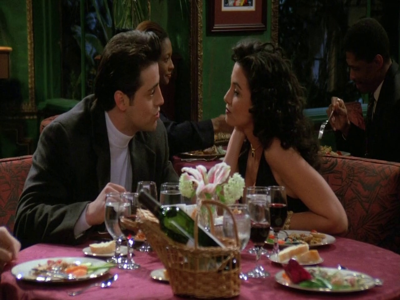

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


anger
input/images/dia1utt1/frame3.jpg


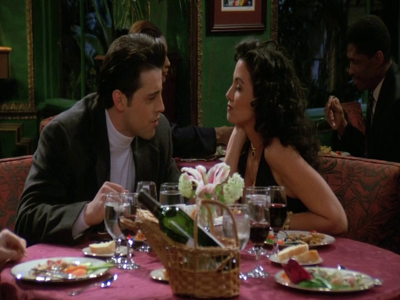

anger
input/images/dia1utt1/frame2.jpg


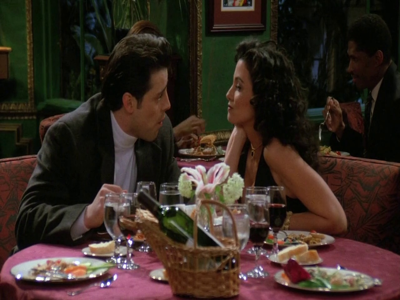

anger
input/images/dia1utt1/frame5.jpg


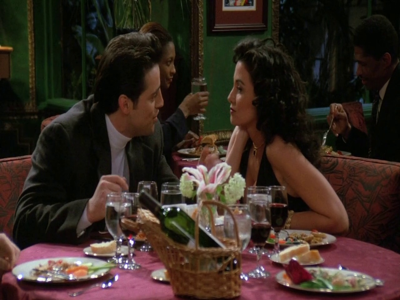

anger
input/images/dia1utt1/frame0.jpg


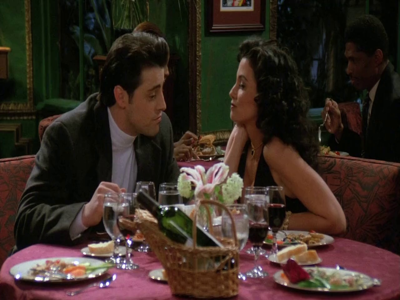

anger
input/images/dia1utt1/frame7.jpg


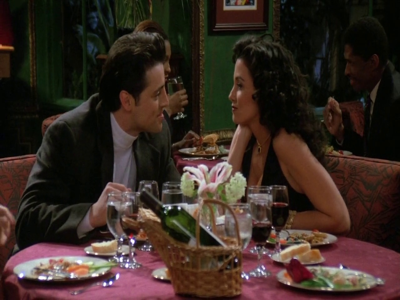

anger
input/images/dia1utt1/frame1.jpg


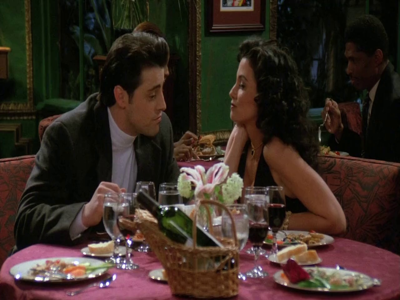

anger
input/images/dia1utt1/frame6.jpg


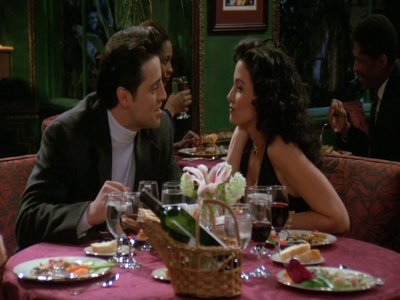

surprise
['anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'surprise']


In [15]:
list_captions = videoCaptions("dia1utt1.mp4") # gave list of emotions
print(list_captions)

In [39]:
# gave list of emotions ^

input/images/dia1utt1/frame4.jpg


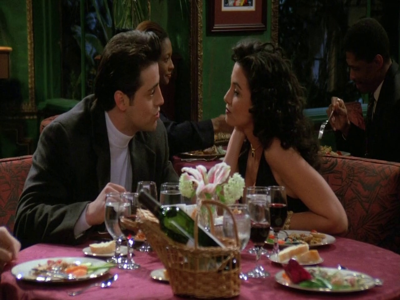

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


the image is of a man and woman sitting at a table
input/images/dia1utt1/frame3.jpg


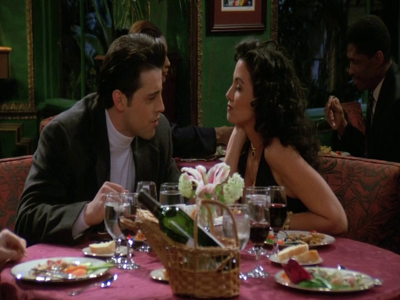

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame2.jpg


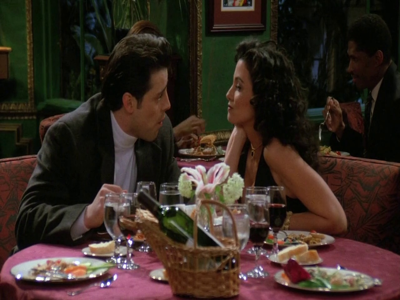

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame5.jpg


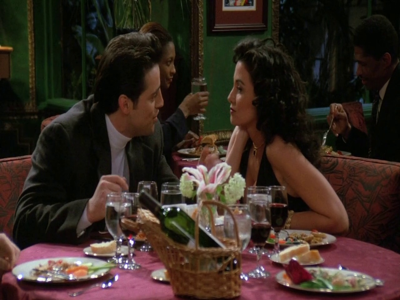

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame0.jpg


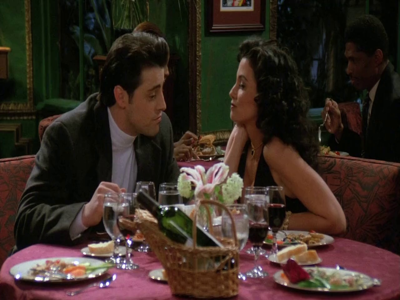

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame7.jpg


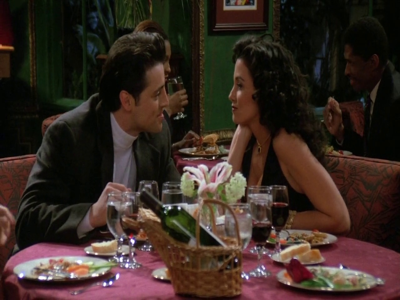

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame1.jpg


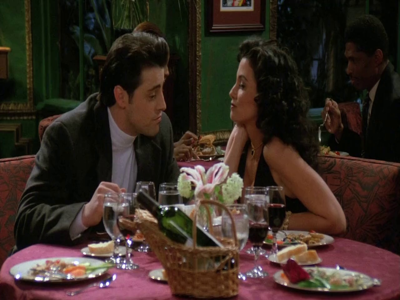

the image is of a man and woman sitting at a table
input/images/dia1utt1/frame6.jpg


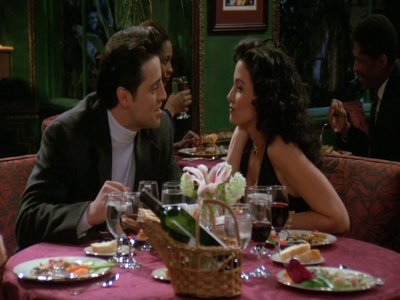

the image is of a man and woman sitting at a table
['the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table', 'the image is of a man and woman sitting at a table']


In [17]:
prompt = "Question: describe the image in using the emotions anger, disgust, fear, surprise, joy, neutral, sadness. Answer:"
list_captions = videoCaptions("dia1utt1.mp4", prompt)
print(list_captions)

input/images/dia1utt1/frame4.jpg


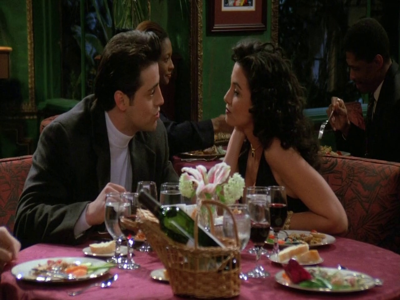

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


love
input/images/dia1utt1/frame3.jpg


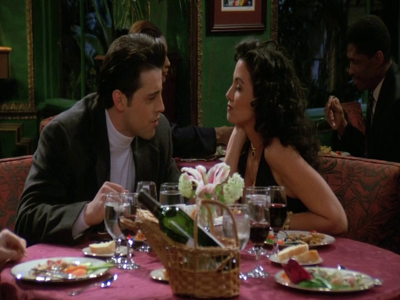

love
input/images/dia1utt1/frame2.jpg


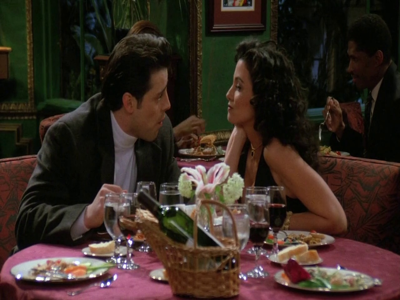

love
input/images/dia1utt1/frame5.jpg


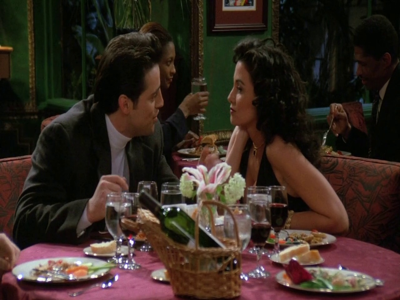

love
input/images/dia1utt1/frame0.jpg


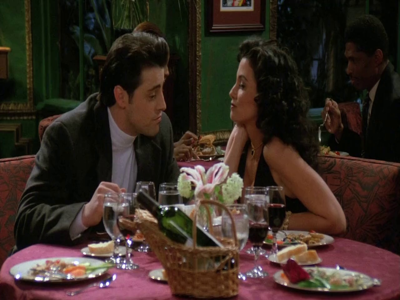

love
input/images/dia1utt1/frame7.jpg


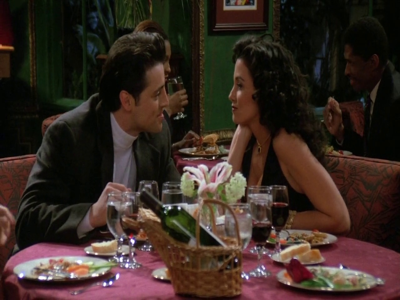

love
input/images/dia1utt1/frame1.jpg


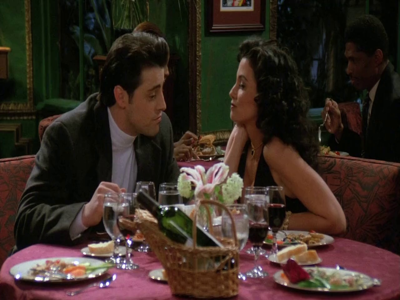

love
input/images/dia1utt1/frame6.jpg


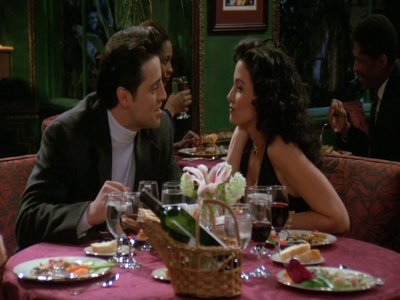

love
['love', 'love', 'love', 'love', 'love', 'love', 'love', 'love']


In [23]:
prompt = "Question: describe the emotion of the image. Answer:"
list_captions = videoCaptions("dia1utt1.mp4", prompt)
print(list_captions)

input/images/dia1utt2/frame4.jpg


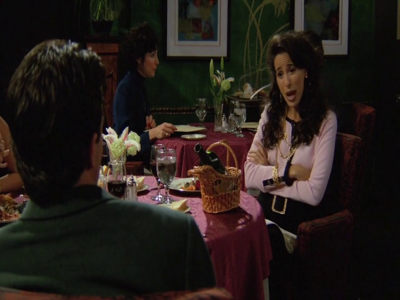

anger
input/images/dia1utt2/frame12.jpg


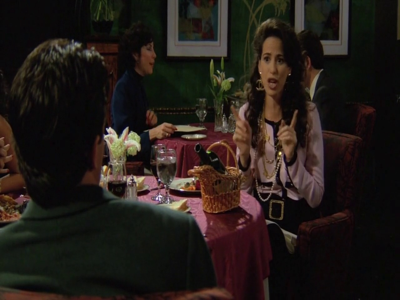

anger
input/images/dia1utt2/frame15.jpg


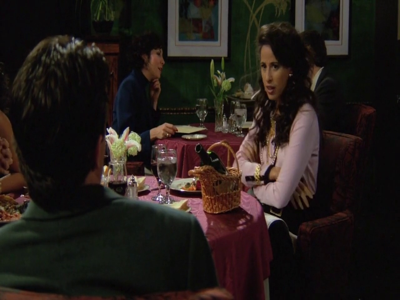

anger
input/images/dia1utt2/frame3.jpg


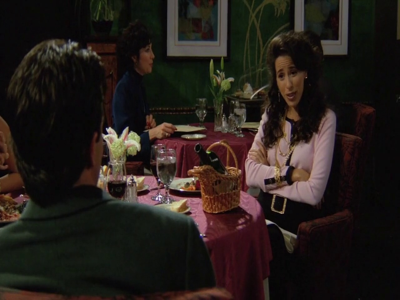

anger
input/images/dia1utt2/frame2.jpg


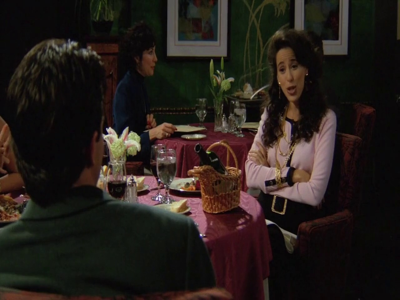

anger
input/images/dia1utt2/frame5.jpg


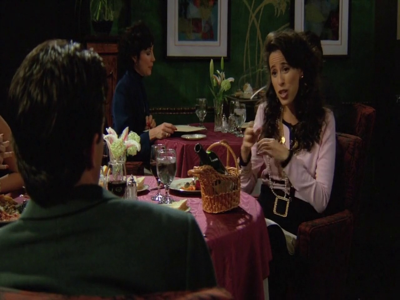

anger
input/images/dia1utt2/frame9.jpg


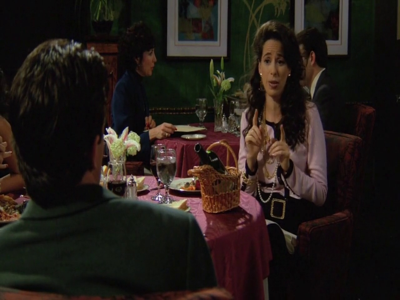

happiness
input/images/dia1utt2/frame10.jpg


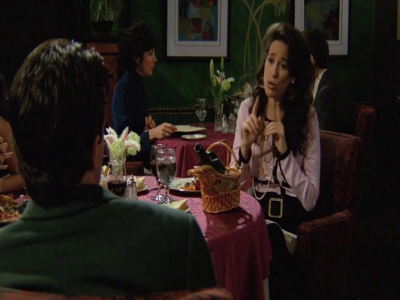

anger
input/images/dia1utt2/frame0.jpg


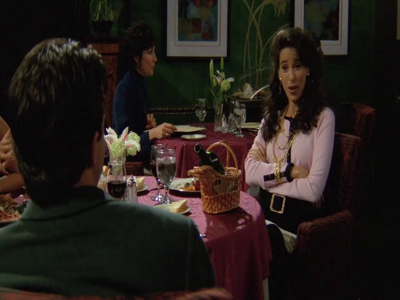

anger
input/images/dia1utt2/frame14.jpg


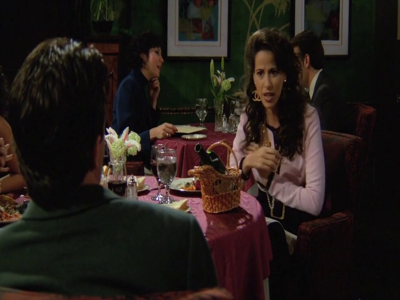

happiness
input/images/dia1utt2/frame11.jpg


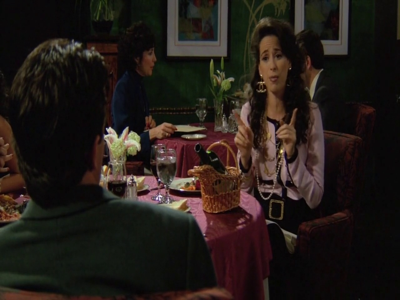

fear
input/images/dia1utt2/frame7.jpg


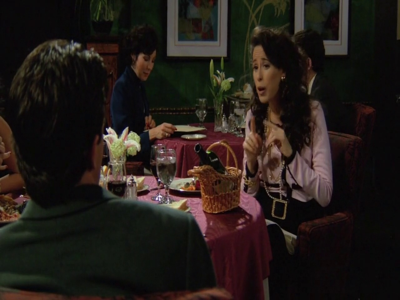

happiness
input/images/dia1utt2/frame1.jpg


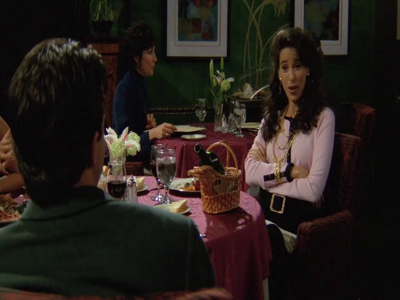

anger
input/images/dia1utt2/frame13.jpg


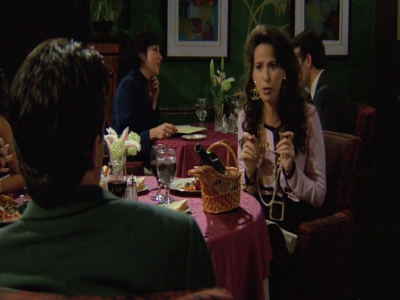

anger
input/images/dia1utt2/frame8.jpg


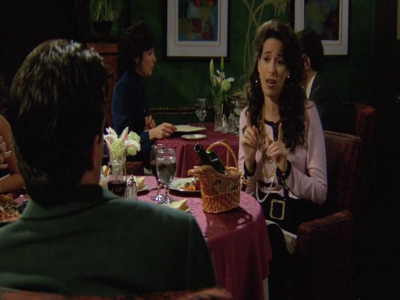

happiness
input/images/dia1utt2/frame6.jpg


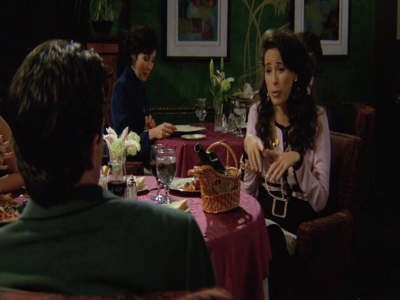

anger
['anger', 'anger', 'anger', 'anger', 'anger', 'anger', 'happiness', 'anger', 'anger', 'happiness', 'fear', 'happiness', 'anger', 'anger', 'happiness', 'anger']


In [24]:
prompt = "Question: describe the emotion of the image. Answer:"
list_captions = videoCaptions("dia1utt2.mp4", prompt)
print(list_captions)

input/images/dia1utt2/frame4.jpg
Question: describe the emotion and the person in the image. Answer:


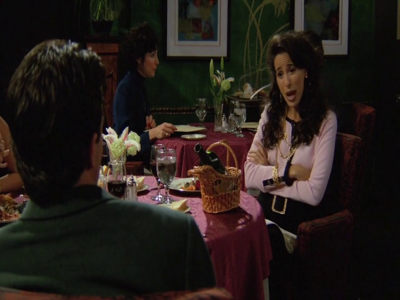

the woman is angry
input/images/dia1utt2/frame12.jpg
Question: describe the emotion and the person in the image. Answer:


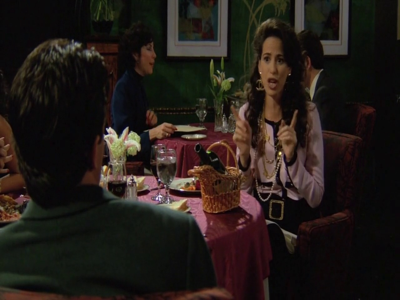

the woman is happy and the man is sad
input/images/dia1utt2/frame15.jpg
Question: describe the emotion and the person in the image. Answer:


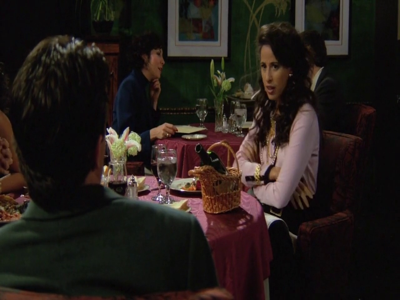

the woman is sad and the man is angry
input/images/dia1utt2/frame3.jpg
Question: describe the emotion and the person in the image. Answer:


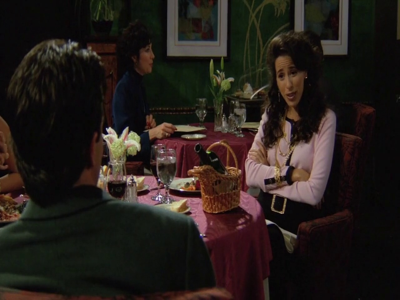

the woman is angry
input/images/dia1utt2/frame2.jpg
Question: describe the emotion and the person in the image. Answer:


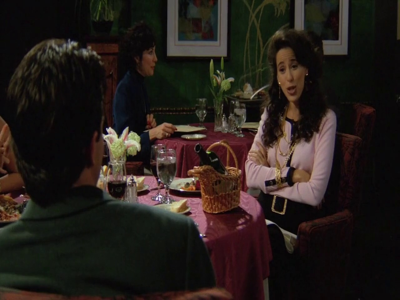

the woman is angry and the man is sad
input/images/dia1utt2/frame5.jpg
Question: describe the emotion and the person in the image. Answer:


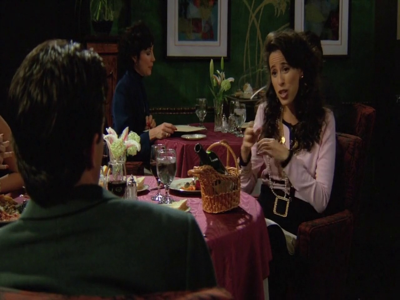

the woman is happy and the man is sad
input/images/dia1utt2/frame9.jpg
Question: describe the emotion and the person in the image. Answer:


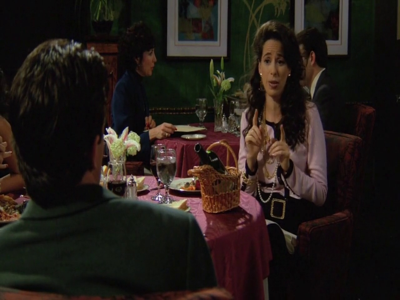

the woman is happy
input/images/dia1utt2/frame10.jpg
Question: describe the emotion and the person in the image. Answer:


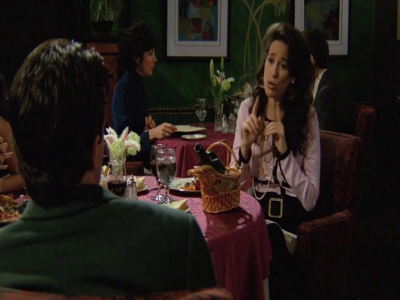

the woman is angry
input/images/dia1utt2/frame0.jpg
Question: describe the emotion and the person in the image. Answer:


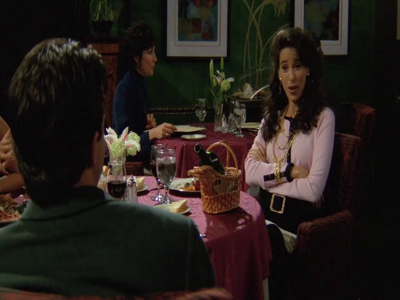

the woman is upset and the man is angry
input/images/dia1utt2/frame14.jpg
Question: describe the emotion and the person in the image. Answer:


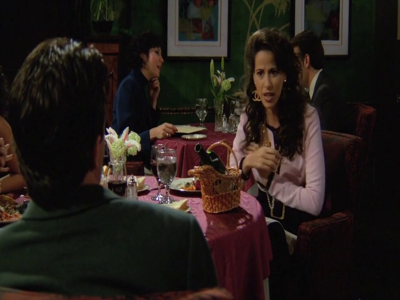

the woman is happy and the man is sad
input/images/dia1utt2/frame11.jpg
Question: describe the emotion and the person in the image. Answer:


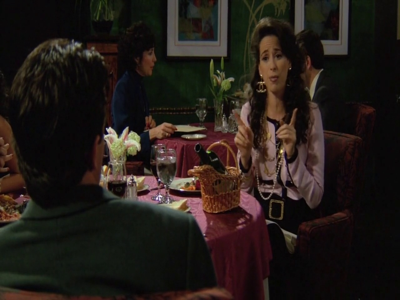

the woman is happy and the man is sad
input/images/dia1utt2/frame7.jpg
Question: describe the emotion and the person in the image. Answer:


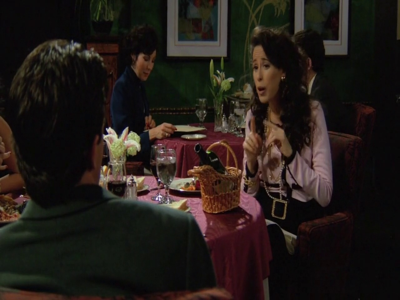

the woman is happy and the man is sad
input/images/dia1utt2/frame1.jpg
Question: describe the emotion and the person in the image. Answer:


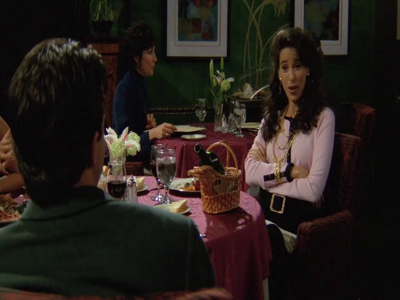

the woman is upset and the man is angry
input/images/dia1utt2/frame13.jpg
Question: describe the emotion and the person in the image. Answer:


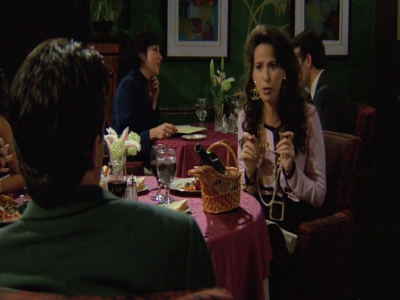

the woman is happy and the man is sad
input/images/dia1utt2/frame8.jpg
Question: describe the emotion and the person in the image. Answer:


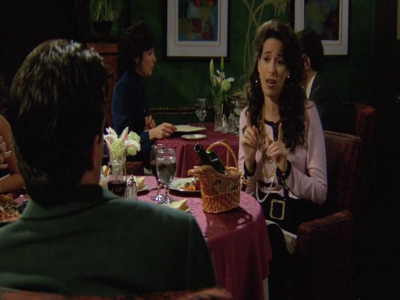

the woman is happy
input/images/dia1utt2/frame6.jpg
Question: describe the emotion and the person in the image. Answer:


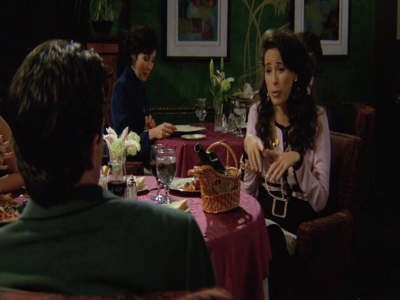

the woman is angry and the man is sad
['the woman is angry', 'the woman is happy and the man is sad', 'the woman is sad and the man is angry', 'the woman is angry', 'the woman is angry and the man is sad', 'the woman is happy and the man is sad', 'the woman is happy', 'the woman is angry', 'the woman is upset and the man is angry', 'the woman is happy and the man is sad', 'the woman is happy and the man is sad', 'the woman is happy and the man is sad', 'the woman is upset and the man is angry', 'the woman is happy and the man is sad', 'the woman is happy', 'the woman is angry and the man is sad']


In [36]:
prompt = "Question: describe the emotion and the person in the image. Answer:"
list_captions = videoCaptions("dia1utt2.mp4", prompt)
print(list_captions)

input/images/dia1utt2/frame4.jpg
Question: number of people in the image. Answer:


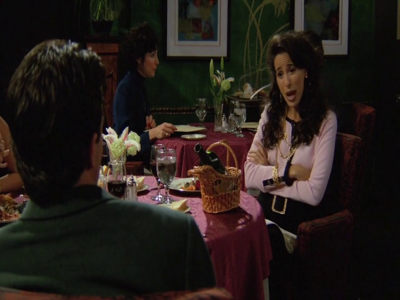

1
input/images/dia1utt2/frame12.jpg
Question: number of people in the image. Answer:


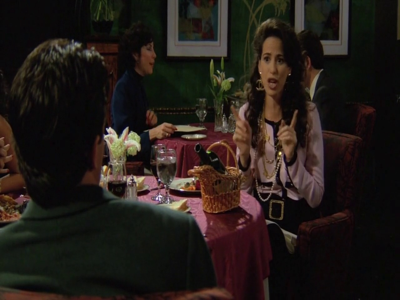

1
input/images/dia1utt2/frame15.jpg
Question: number of people in the image. Answer:


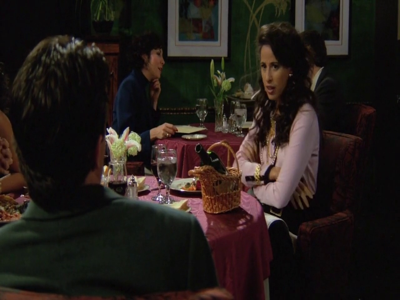

1
input/images/dia1utt2/frame3.jpg
Question: number of people in the image. Answer:


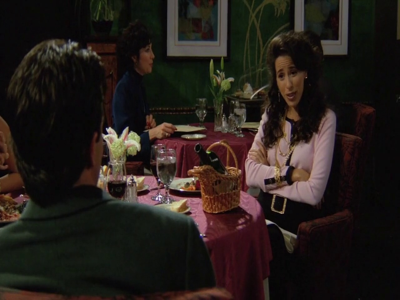

1
input/images/dia1utt2/frame2.jpg
Question: number of people in the image. Answer:


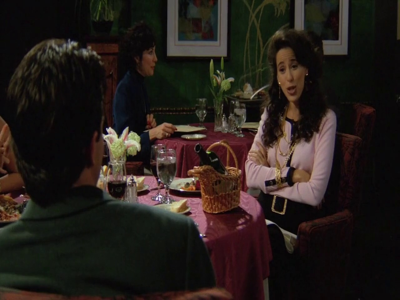

1
input/images/dia1utt2/frame5.jpg
Question: number of people in the image. Answer:


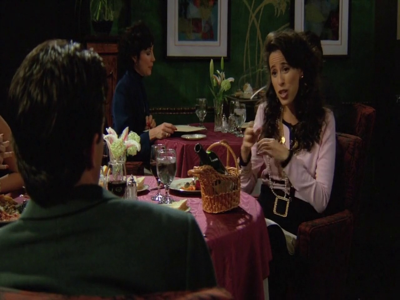

1
input/images/dia1utt2/frame9.jpg
Question: number of people in the image. Answer:


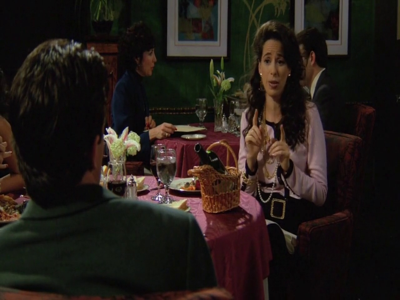

1
input/images/dia1utt2/frame10.jpg
Question: number of people in the image. Answer:


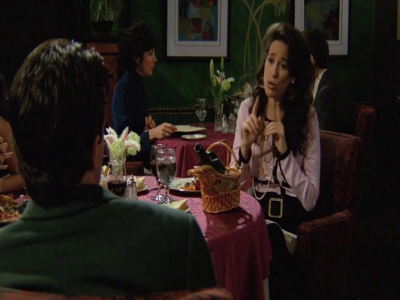

1
input/images/dia1utt2/frame0.jpg
Question: number of people in the image. Answer:


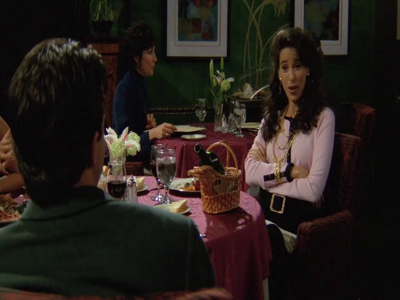

1
input/images/dia1utt2/frame14.jpg
Question: number of people in the image. Answer:


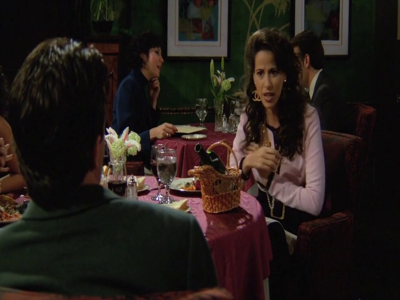

1
input/images/dia1utt2/frame11.jpg
Question: number of people in the image. Answer:


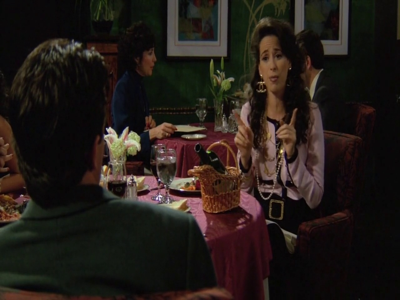

1
input/images/dia1utt2/frame7.jpg
Question: number of people in the image. Answer:


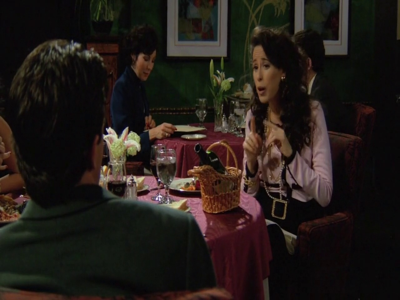

1
input/images/dia1utt2/frame1.jpg
Question: number of people in the image. Answer:


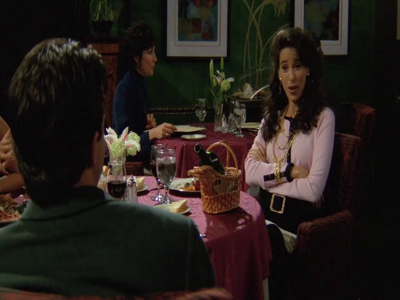

1
input/images/dia1utt2/frame13.jpg
Question: number of people in the image. Answer:


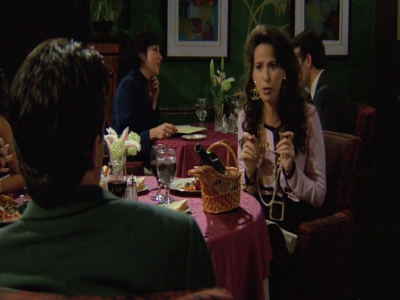

1
input/images/dia1utt2/frame8.jpg
Question: number of people in the image. Answer:


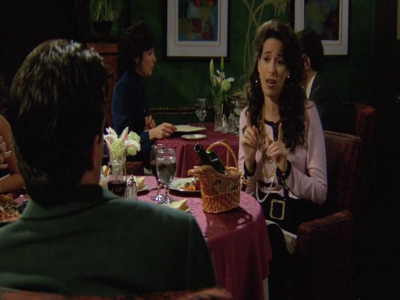

1
input/images/dia1utt2/frame6.jpg
Question: number of people in the image. Answer:


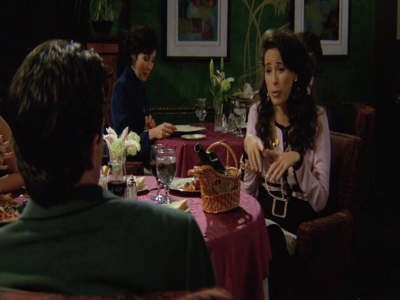

1
['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1']


In [35]:
prompt = "Question: number of people in the image. Answer:"
list_captions = videoCaptions("dia1utt2.mp4", prompt)
print(list_captions)

input/images/dia1utt2/frame4.jpg
Question: describe the people and their emotions in detail. Answer:


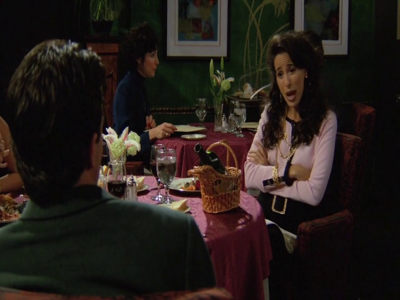

the woman is angry, the man is sad, the woman is happy, the man is happy
input/images/dia1utt2/frame12.jpg
Question: describe the people and their emotions in detail. Answer:


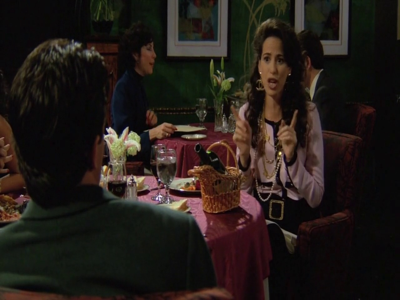

the woman is talking to the man
input/images/dia1utt2/frame15.jpg
Question: describe the people and their emotions in detail. Answer:


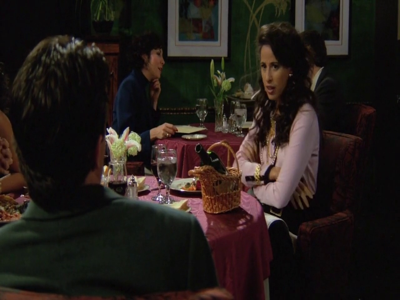

the people are sitting at a table and are having dinner
input/images/dia1utt2/frame3.jpg
Question: describe the people and their emotions in detail. Answer:


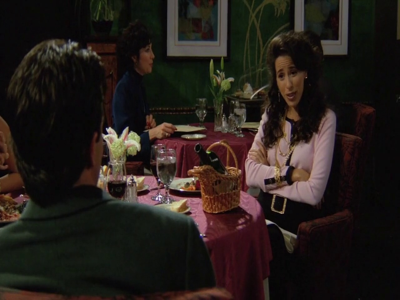

the woman is angry, the man is sad, the woman is sad, the man is angry
input/images/dia1utt2/frame2.jpg
Question: describe the people and their emotions in detail. Answer:


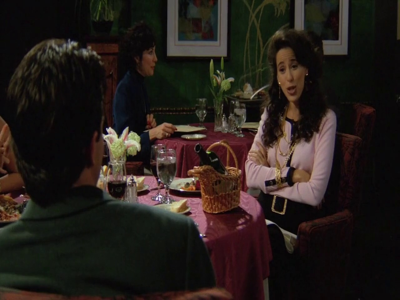

the woman is angry, the man is sad, the woman is sad, the man is angry
input/images/dia1utt2/frame5.jpg
Question: describe the people and their emotions in detail. Answer:


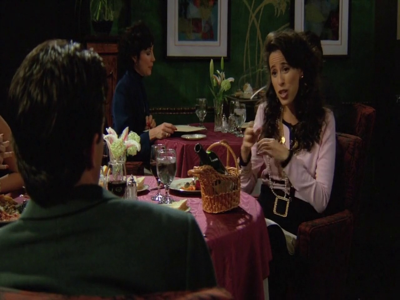

the woman is in a pink sweater and the man is in a black shirt
input/images/dia1utt2/frame9.jpg
Question: describe the people and their emotions in detail. Answer:


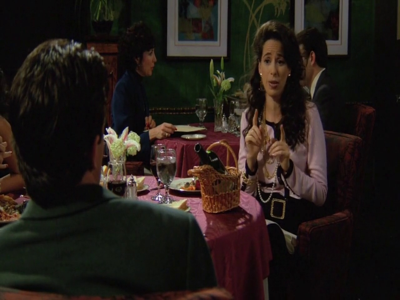

the woman is happy and the man is sad
input/images/dia1utt2/frame10.jpg
Question: describe the people and their emotions in detail. Answer:


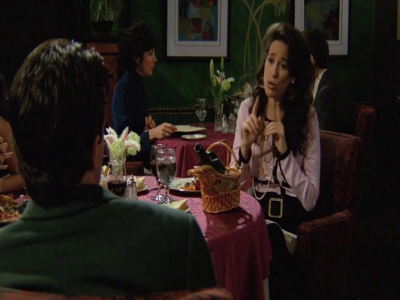

the woman is talking to the man
input/images/dia1utt2/frame0.jpg
Question: describe the people and their emotions in detail. Answer:


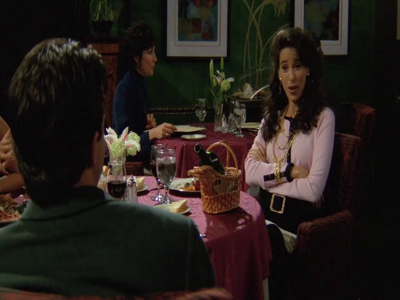

the woman is sitting at the table with her husband and daughter
input/images/dia1utt2/frame14.jpg
Question: describe the people and their emotions in detail. Answer:


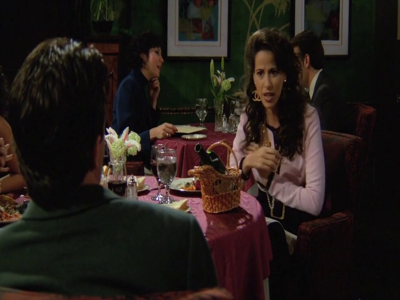

the woman is sitting at the table with her husband and their son
input/images/dia1utt2/frame11.jpg
Question: describe the people and their emotions in detail. Answer:


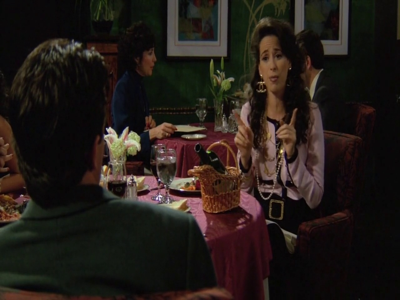

the woman is talking to the man
input/images/dia1utt2/frame7.jpg
Question: describe the people and their emotions in detail. Answer:


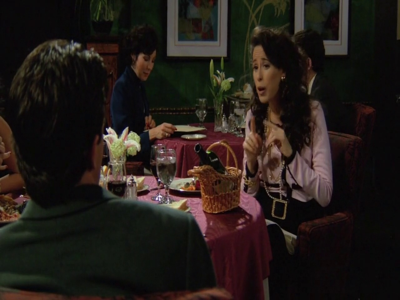

the woman is very happy and the man is very sad
input/images/dia1utt2/frame1.jpg
Question: describe the people and their emotions in detail. Answer:


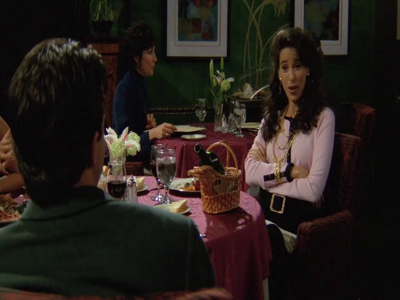

the woman is sitting at the table with her husband and daughter
input/images/dia1utt2/frame13.jpg
Question: describe the people and their emotions in detail. Answer:


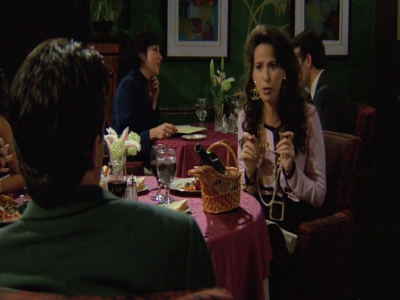

the people are sitting at a table and are eating
input/images/dia1utt2/frame8.jpg
Question: describe the people and their emotions in detail. Answer:


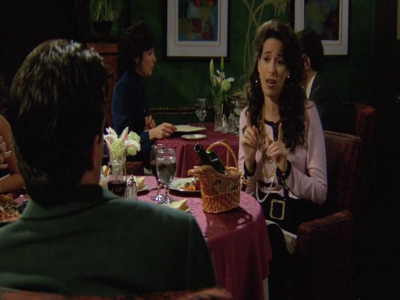

the woman is happy and the man is sad
input/images/dia1utt2/frame6.jpg
Question: describe the people and their emotions in detail. Answer:


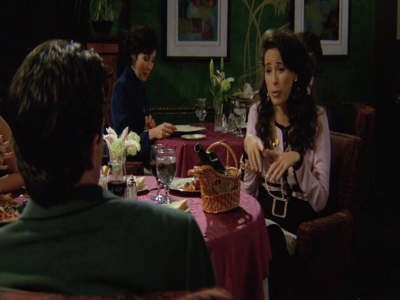

the woman is angry, the man is sad, the woman is happy, the man is happy
['the woman is angry, the man is sad, the woman is happy, the man is happy', 'the woman is talking to the man', 'the people are sitting at a table and are having dinner', 'the woman is angry, the man is sad, the woman is sad, the man is angry', 'the woman is angry, the man is sad, the woman is sad, the man is angry', 'the woman is in a pink sweater and the man is in a black shirt', 'the woman is happy and the man is sad', 'the woman is talking to the man', 'the woman is sitting at the table with her husband and daughter', 'the woman is sitting at the table with her husband and their son', 'the woman is talking to the man', 'the woman is very happy and the man is very sad', 'the woman is sitting at the table with her husband and daughter', 'the people are sitting at a table and are eating', 'the woman is happy and the man is sad', 'the woman is angry, the man is sad, the woman is happy, the man is happy']


In [38]:
prompt = "Question: describe the people and their emotions in detail. Answer:"
list_captions = videoCaptions("dia1utt2.mp4", prompt)
print(list_captions)